# Rakuten case study


In [1]:
import pandas as pd

import torch.nn as nn
import torch
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset



from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import numpy as np

from torch.utils.data import Dataset, DataLoader

from matplotlib import pyplot as plt

from sklearn.preprocessing import OneHotEncoder

## Data preprocessing part

In [2]:
#read dataset 
def read_custom_dataset(file_path):
    """
    Reads a custom formatted file where the first line represents column headers
    and the subsequent lines contain data, similar to a CSV.

    Parameters:
    file_path (str): The path to the file.

    Returns:
    DataFrame: A Pandas DataFrame containing the data from the file.
    """
    try:
        # Read the file into a DataFrame, assuming comma separation
        data = pd.read_csv(file_path, delimiter=",")
        return data
    except Exception as e:
        print(f"An error occurred while reading the file: {e}")

# Example usage
file_path_test = '/users/Etu3/28600693/Documents/Rakuten_study_case/Interview Dataset Rakuten Advertising Test Set'  
file_path_train = '/users/Etu3/28600693/Documents/Rakuten_study_case/Interview Dataset Rakuten Advertising Train Set'  
test_dataset = read_custom_dataset(file_path_test)
train_dataset = read_custom_dataset(file_path_train)
print(test_dataset.head())
print(train_dataset.head())

                  date  zone_id  media_id  advertiser_id  campaign_id  \
0  2017-05-04 00:00:00     1117        89           1603         8015   
1  2017-05-07 00:00:00      366        48           1148         5742   
2  2017-05-04 00:00:00     2347        77           1605         8029   
3  2017-05-06 00:00:00      709        94           1603         8018   
4  2017-05-04 00:00:00     1122       101           1603         8015   

          domain  visibility  ad_id  width  height country_ref     device  \
0       arcor.de         1.0   9469    160     600          FR    firefox   
1            NaN         1.0   1453    800     250          DE  iosTablet   
2  visorando.com         NaN   5837   1000      90          FR    firefox   
3      orange.fr         NaN   4659    728      90          FR     safari   
4    outlook.com         NaN   9793    160     600          FR    firefox   

   imps  
0     1  
1     1  
2     1  
3     8  
4     8  
                  date  zone_id  media

In [3]:
def split_dataset(data):
    """
    Splits the dataset into features (X) and target (Y).

    Parameters:
    data (DataFrame): The Pandas DataFrame containing the dataset.

    Returns:
    X (DataFrame): The features of the dataset.
    Y (Series): The target variable of the dataset.
    """
    # Assuming 'clicks' is the target variable
    Y = data['clicks']
    X = data.drop('clicks', axis=1)
    return X, Y

# Assuming you have already read your dataset into a DataFrame named 'dataset'
X_train, Y_train = split_dataset(train_dataset)
X_test = test_dataset
X_train

,date,zone_id,media_id,advertiser_id,campaign_id,domain,visibility,ad_id,width,height,country_ref,device,imps
0,2017-05-02 00:00:00,2794,149,3206,16034,fatsecret.com,1.0,14885,250,250,US,safari,1
1,2017-05-06 00:00:00,879,77,1612,8060,sfrregie.com,NaN,7126,300,250,FR,firefox,2
2,2017-05-07 00:00:00,1321,119,2061,10306,alberghiera.it,2.0,11696,320,50,IT,iosPhone,1
3,2017-05-04 00:00:00,2347,77,1605,8029,visorando.com,NaN,5837,1000,90,FR,firefox,1
4,2017-05-02 00:00:00,931,90,1604,8023,pblv-plusbellelavie.fr,NaN,7414,300,250,FR,firefox,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5395046,2017-05-02 00:00:00,397,47,1145,5729,meinestadt.de,NaN,1762,120,600,DE,firefox,1
5395047,2017-05-07 00:00:00,1076,87,1604,8021,funnykdo.com,NaN,9190,120,600,FR,ie,4
5395048,2017-05-05 00:00:00,969,100,1611,8059,yahoo.com,1.0,7209,300,250,FR,chrome,23
5395049,2017-05-03 00:00:00,2370,172,1632,8161,viamichelin.fr,2.0,7182,300,250,FR,chrome,2


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
original_imps_train_tensor = torch.tensor(X_train['imps'], dtype=torch.float32).to(device)
original_clicks_train_tensor = torch.tensor(Y_train, dtype=torch.float32).to(device)
original_imps_test_tensor = torch.tensor(X_test['imps'], dtype=torch.float32).to(device)
original_imps_test = X_test['imps']

In [5]:
# count number of clicks >= 1 
Y_train[Y_train >= 5].count()

11831

In [6]:
# hangling missing values
numerical_columns = ['visibility', 'width', 'height', 'imps']
X_train[numerical_columns] = X_train[numerical_columns].fillna(X_train[numerical_columns].mean())

# Fill NaNs in categorical columns with a placeholder value (e.g., 'Unknown')
categorical_columns = X_train.select_dtypes(include=['object']).columns
X_train[categorical_columns] = X_train[categorical_columns].fillna('Unknown')

# Convert to datetime
X_train['date'] = pd.to_datetime(X_train['date'])

X_train['day_of_week'] = X_train['date'].dt.dayofweek
X_train['month'] = X_train['date'].dt.month
X_train['year'] = X_train['date'].dt.year
X_train['day'] = X_train['date'].dt.day

# drop date column
X_train = X_train.drop('date', axis=1)




# Fill NaNs in numerical columns with their mean
numerical_columns = ['visibility', 'width', 'height', 'imps']
X_test[numerical_columns] = X_test[numerical_columns].fillna(X_test[numerical_columns].mean())

# Fill NaNs in categorical columns with a placeholder value (e.g., 'Unknown')
categorical_columns = X_test.select_dtypes(include=['object']).columns
X_test[categorical_columns] = X_test[categorical_columns].fillna('Unknown')

# Convert to datetime
X_test['date'] = pd.to_datetime(X_test['date'])

X_test['day_of_week'] = X_test['date'].dt.dayofweek
X_test['month'] = X_test['date'].dt.month
X_test['year'] = X_test['date'].dt.year
X_test['day'] = X_test['date'].dt.day

# drop date column
X_test = X_test.drop('date', axis=1)



In [7]:
X_test

,zone_id,media_id,advertiser_id,campaign_id,domain,visibility,ad_id,width,height,country_ref,device,imps,day_of_week,month,year,day
0,1117,89,1603,8015,arcor.de,1.000000,9469,160,600,FR,firefox,1,3,5,2017,4
1,366,48,1148,5742,Unknown,1.000000,1453,800,250,DE,iosTablet,1,6,5,2017,7
2,2347,77,1605,8029,visorando.com,1.551142,5837,1000,90,FR,firefox,1,3,5,2017,4
3,709,94,1603,8018,orange.fr,1.551142,4659,728,90,FR,safari,8,5,5,2017,6
4,1122,101,1603,8015,outlook.com,1.551142,9793,160,600,FR,firefox,8,3,5,2017,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019081,780,89,1633,8169,pausepeople.com,2.000000,5460,728,90,FR,chrome,1,3,5,2017,4
2019082,1076,87,1604,8021,funnykdo.com,1.551142,9190,120,600,FR,ie,1,6,5,2017,7
2019083,859,76,1639,8198,sceneweb.fr,1.551142,7301,300,250,FR,ie,1,2,5,2017,3
2019084,49,13,230,1154,xcook.info,2.000000,140,300,250,BE,iosTablet,1,3,5,2017,4


In [8]:
X_train.isnull().any()


zone_id          False
media_id         False
advertiser_id    False
campaign_id      False
domain           False
visibility       False
ad_id            False
width            False
height           False
country_ref      False
device           False
imps             False
day_of_week      False
month            False
year             False
day              False
dtype: bool

- Features like zone_id, media_id, advertiser_id, campaign_id, ad_id may not require normalization or standardization if they are categorical IDs represented as numbers. 
- Temporal features like day_of_week, month, year, and day might not need normalization or standardization
- The width, height, and imps features are good candidates for normalization or standardization as they are likely to vary significantly and could affect the performance of distance-based models.
- visibility should be normalized or standardized, especially if it varies widely.

In [10]:
from sklearn.preprocessing import StandardScaler

numerical_columns = ['visibility', 'width', 'height']
# Applying standard scaler
scaler = StandardScaler()
X_train[numerical_columns] = scaler.fit_transform(X_train[numerical_columns])


# Applying standard scaler
X_test[numerical_columns] = scaler.transform(X_test[numerical_columns])

#  Applying stadard scaler on Y_train
scaler_y = StandardScaler()
Y_train_scaled = scaler_y.fit_transform(Y_train.values.reshape(-1, 1))

# Save the scaler
import joblib
joblib.dump(scaler, 'scaler.pkl')
joblib.dump(scaler_y, 'scaler_y.pkl')






['scaler_y.pkl']

In [11]:
scaler_imps = StandardScaler()
X_train['imps'] = scaler_imps.fit_transform(X_train['imps'].values.reshape(-1, 1))
X_test['imps'] = scaler_imps.fit_transform(X_test['imps'].values.reshape(-1, 1)) 

In [ ]:
label_encoders = {}
categorical_columns = ['zone_id', 'media_id', 'advertiser_id', 'campaign_id', 'domain', 'ad_id', 'country_ref', 'device', 'day_of_week', 'month', 'day', 'year']
for col in categorical_columns:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col].values)
    label_encoders[col] = le  # Store each encoder


# label encoder for X_test
label_encoders_test = {}
for col in categorical_columns:
    le = LabelEncoder()
    X_test[col] = le.fit_transform(X_test[col].values)
    label_encoders_test[col] = le  # Store each encoder

## Define Loss

In [13]:
class CustomLoss(nn.Module):
    def __init__(self,eps = 1e-6):
        super(CustomLoss, self).__init__()
        self.eps = eps
    
    def __check_data_validity(self, pred_clicks, clicks, imps):
        assert torch.all(clicks >= 0) and torch.all(clicks <= imps), "Clicks must be non-negative and less than or equal to impressions"
        assert torch.all(imps > 0), "Impressions must be greater than zero to avoid division by zero in loss calculation"

        assert not torch.isnan(pred_clicks).any(), "NaNs in pred_clicks"
        assert not torch.isnan(clicks).any(), "NaNs in clicks"
        assert not torch.isnan(imps).any(), "NaNs in imps"

        assert torch.all(pred_clicks >= 0), "Negative values in pred_clicks"
        assert torch.all(imps > 0), "Non-positive values in imps"




    def forward(self, pred_clicks, clicks, imps):
        """
        y_pred: The predicted CTR for each example, a tensor of shape (n_examples, 1).
        clicks: The actual clicks for each example, a tensor of shape (n_examples, 1).
        imps: The number of impressions for each example, a tensor of shape (n_examples, 1).
        """
        # assert things are not none or nan
        self.__check_data_validity(pred_clicks, clicks, imps)
        # Calculating the predicted CTR
        y_pred = pred_clicks / imps

        # check theres no nan or inf in y_pred
        assert torch.isfinite(y_pred).all() # Check for NaN or Inf values
        assert torch.all(y_pred >= 0) #and torch.all(y_pred <= 1) # CTR must be between 0 and 1
        # Clip the predicted CTR to avoid log(0)
        y_pred = torch.clamp(y_pred, self.eps, 1 - self.eps)
      

        # Calculating the log loss component
        log_loss = clicks * torch.log(y_pred + self.eps) + (imps - clicks) * torch.log(1 - y_pred + self.eps)
        # print(torch.log(y_pred + self.eps))
        
        # Normalizing by the number of impressions
        loss = -torch.sum(log_loss / torch.sum(imps))
        return loss

# model for trainning

In [14]:

print(X_train.dtypes)

zone_id            int64
media_id           int64
advertiser_id      int64
campaign_id        int64
domain             int64
visibility       float64
ad_id              int64
width            float64
height           float64
country_ref        int64
device             int64
imps             float64
day_of_week        int64
month              int64
year               int64
day                int64
dtype: object


In [15]:
# Convert X_train and Y_train to PyTorch tensors

X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
# imps_tensor = torch.tensor(X_train['imps'].values, dtype=torch.float32)
# X_train_drop = X_train.drop('imps', axis=1)
# X_train_tensor = torch.tensor(X_train_drop.values, dtype=torch.float32)


Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32)

# Reshape Y_train_tensor to make it a 2D tensor
Y_train_tensor = torch.tensor(Y_train_scaled, dtype=torch.float32).view(-1, 1)


# Create a TensorDataset and DataLoader
train_data = TensorDataset(X_train_tensor, Y_train_tensor)
train_loader = DataLoader(train_data, batch_size=128, shuffle=True)

# # Convert X_test to a PyTorch tensor   
# X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)

# # Create a TensorDataset and DataLoader
# test_data = TensorDataset(X_test_tensor)
# test_loader = DataLoader(test_data, batch_size=128, shuffle=False)



In [16]:
import torch.nn.functional as F



class MLP(nn.Module): 
    def __init__(self, input_size):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.dropout1 = nn.Dropout(0.5)  # Dropout layer
        self.fc2 = nn.Linear(128, 64)
        self.dropout2 = nn.Dropout(0.5)  # Dropout layer
        self.fc3 = nn.Linear(64, 32)
        self.dropout3 = nn.Dropout(0.5)  # Dropout layer
        self.fc4 = nn.Linear(32, 1)
        self.relu = nn.ReLU()
        
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.dropout1(x)  # Applying dropout
        x = self.relu(self.fc2(x))
        x = self.dropout2(x)  # Applying dropout
        x = self.relu(self.fc3(x))
        x = self.dropout3(x)  # Applying dropout
        x = self.fc4(x)
        x = F.relu(x) 
        return x

In [19]:

print("Using device:", device)
model = MLP(input_size=X_train.shape[1])
model.to(device)
criterion = nn.MSELoss()  # just for test after need to  chagnge to a custom loss function
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay= 0.01)
# Number of epochs
epochs=5

losses = [] 
all_losses = []
for epoch in range(epochs):
    loss_one_epoch = []
    model.train()
    sum_loss = 0
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        # Zero the gradients
        optimizer.zero_grad()
        
        # Forward pass
        output = model(data)
        
        # Compute the loss
        loss = criterion(output, target)
        
        # Backward pass and optimize
        loss.backward()
        optimizer.step()
        print(f'Epoch {epoch+1}/{epochs}, Step {batch_idx+1}, Loss {loss.item()}')
        loss_one_epoch.append(loss.item())
        sum_loss += loss.item()
    
    print(f'Epoch {epoch+1}/{epochs} \t Loss: {sum_loss/len(train_loader):.4f}')
    losses.append( sum_loss / len(train_loader))
    all_losses.append(loss_one_epoch)

# Save the model
torch.save(model.state_dict(), 'MLPmodel.pth')


Using device: cuda


2024-03-22 15:14:28.601672: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-22 15:14:28.718103: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-22 15:14:29.959243: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /Infos/lmd/2021/licence/ue/LU3IN029-2021oct/kO6/bin/gcc/lib64:/Infos/lmd/2021/licence/ue/LU3IN029-2021oct/kO6/bin/gcc/lib64::/opt/gurobi801/linux64/lib:/opt/gurobi801/linux64/lib
2024-03-22 15:14:29.959349: W ten

Epoch 1/5, Step 1, Loss 129754.109375
Epoch 1/5, Step 2, Loss 205628.03125
Epoch 1/5, Step 3, Loss 95228.828125
Epoch 1/5, Step 4, Loss 303500.6875
Epoch 1/5, Step 5, Loss 145357.15625
Epoch 1/5, Step 6, Loss 104673.0703125
Epoch 1/5, Step 7, Loss 265833.625
Epoch 1/5, Step 8, Loss 72513.046875
Epoch 1/5, Step 9, Loss 70631.484375
Epoch 1/5, Step 10, Loss 57342.5078125
Epoch 1/5, Step 11, Loss 29697.15625
Epoch 1/5, Step 12, Loss 75269.8828125
Epoch 1/5, Step 13, Loss 62070.91015625
Epoch 1/5, Step 14, Loss 106502.203125
Epoch 1/5, Step 15, Loss 507253.0625
Epoch 1/5, Step 16, Loss 65199.59765625
Epoch 1/5, Step 17, Loss 70918.3671875
Epoch 1/5, Step 18, Loss 74183.125
Epoch 1/5, Step 19, Loss 30334.515625
Epoch 1/5, Step 20, Loss 104949.3671875
Epoch 1/5, Step 21, Loss 38356.7578125
Epoch 1/5, Step 22, Loss 161954.875
Epoch 1/5, Step 23, Loss 59681.69921875
Epoch 1/5, Step 24, Loss 31532.634765625
Epoch 1/5, Step 25, Loss 91779.265625
Epoch 1/5, Step 26, Loss 115934.59375
Epoch 1/5, S

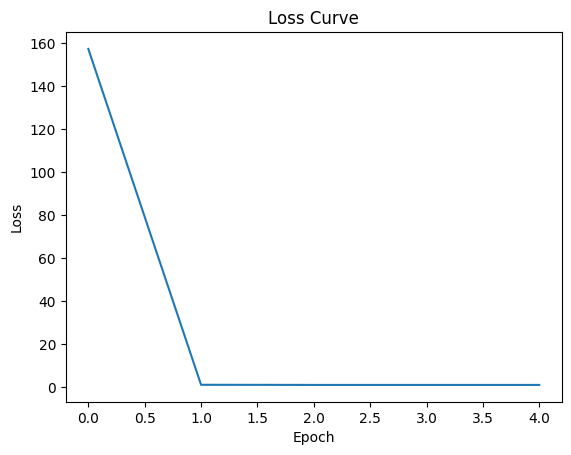

In [20]:
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Curve')
plt.show()


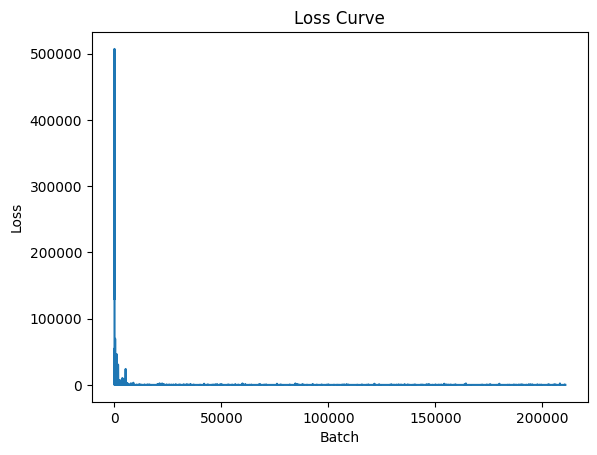

In [21]:

all_losses_in_one = np.concatenate((all_losses), axis=0)

plt.plot(all_losses_in_one)
plt.xlabel('Batch')
plt.ylabel('Loss')
plt.title('Loss Curve')
plt.show()



## predict X_test


In [22]:
X_test


,zone_id,media_id,advertiser_id,campaign_id,domain,visibility,ad_id,width,height,country_ref,device,imps,day_of_week,month,year,day
0,1085,88,30,120,3113,-1.571073,9056,-0.967084,1.553937,7,4,-0.104339,3,0,0,3
1,350,47,16,75,755,-1.571073,1352,1.252811,-0.100689,5,8,-0.104339,6,0,0,6
2,2249,76,32,134,46814,-0.023768,5601,1.946528,-0.857089,7,4,-0.104339,3,0,0,3
3,685,93,30,123,32281,-0.023768,4441,1.003073,-0.857089,7,11,0.451935,5,0,0,5
4,1090,100,30,120,32550,-0.023768,9366,-0.967084,1.553937,7,4,0.451935,3,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019081,756,88,60,272,33164,1.236378,5230,1.003073,-0.857089,7,2,-0.104339,3,0,0,3
2019082,1046,86,31,126,16912,-0.023768,8783,-1.105827,1.553937,7,6,-0.104339,6,0,0,6
2019083,834,75,66,300,38336,-0.023768,6998,-0.481482,-0.100689,7,6,-0.104339,2,0,0,2
2019084,46,12,3,16,48843,1.236378,132,-0.481482,-0.100689,1,8,-0.104339,3,0,0,3


## Evaluation


In [ ]:
# # load model  from .pth 
# from os import path


# if path.exists('model.pth'):
#     model = MLP(input_size=X_train.shape[1])
#     model.load_state_dict(torch.load('model.pth'))

In [23]:
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)

# original_imps_test = scaler_imps.inverse_transform(X_test['imps'].values.reshape(-1, 1))
# original_imps_test = original_imps_test.flatten()

model.eval()
with torch.no_grad():
    predictions = model(X_test_tensor).cpu().numpy()

# Assuming you have original_imps_test ready (inverse transformed if needed)
clicks_pred = scaler_y.inverse_transform(predictions)
clicks_pred = np.where(clicks_pred < 0, 0, clicks_pred)
clicks_pred = clicks_pred.flatten()

clicks_pred   = np.round(clicks_pred)

# Save the predictions as csv
clicks = pd.DataFrame({'clicks': clicks_pred})


# calculate CTR 
ctr = clicks_pred/original_imps_test
ctr = np.where(ctr < 0, 0, ctr)
ctr = ctr.flatten()
ctr = np.round(ctr, 2)

# clicks['CTR'] = ctr
clicks.to_csv('click_mse.csv', index=False)


In [ ]:
# original_imps_train = scaler_imps.inverse_transform(X_train['imps'].values.reshape(-1, 1))
# original_imps_train = original_imps_train.flatten()
# original_imps_train = np.round(original_imps_train, 2)
# original_imps_train = original_imps_train.astype(int)
# original_imps_train 
# original_imps_train_tensor = torch.tensor(original_imps_train, dtype=torch.float32).to(device)


array([ 1,  1,  1, ..., 10,  1,  1])

In [ ]:
Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).view(-1, 1)

In [24]:
# Ensure the model is in evaluation mode
model.eval()

# Prepare the DataLoader for test data similar to the training DataLoader
# This assumes you have tensors X_test_tensor, Y_test_clicks_tensor, and Y_test_imps_tensor ready
val_data = TensorDataset(X_train_tensor, original_clicks_train_tensor, original_imps_train_tensor)
val_loader = DataLoader(val_data, batch_size=128, shuffle=False)

# Initialize the custom loss
custom_loss = CustomLoss()

# No need to track gradients for evaluation
with torch.no_grad():
    total_loss = 0.0
    # Iterate over the test DataLoader
    for data, true_clicks, imps in val_loader:
        # Move tensors to the same device as the model
        data, true_clicks, imps = data.to(device), true_clicks.to(device), imps.to(device)
        
        # Predict clicks using the model
        predicted_clicks = model(data)
        
        # Calculate the custom loss
        loss = custom_loss(predicted_clicks, true_clicks, imps)
        total_loss += loss.item()  # Accumulate the total loss

# Compute the average loss over all the test data
average_loss = total_loss / len(val_loader)
print(f'Average Test Loss: {average_loss}')
print(f'Last loss: {loss.item()}')

Average Test Loss: 38.718206876507715
Last loss: 67.44551086425781
